In [1]:
!git clone https://github.com/Rietchie0119/Behavioral_Cloning

Cloning into 'Behavioral_Cloning'...
remote: Enumerating objects: 25555, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 25555 (delta 0), reused 3 (delta 0), pack-reused 25551
Receiving objects: 100% (25555/25555), 340.28 MiB | 19.63 MiB/s, done.
Resolving deltas: 100% (4/4), done.
Updating files: 100% (12164/12164), done.


In [2]:
!ls Behavioral_Cloning/Data

driving_log.csv  IMG


In [3]:
!pip3 install imgaug

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [5]:
datadir = 'Behavioral_Cloning/Data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

<ipython-input-5-79f385836ec6>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [6]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
# 디렉터리를 생략하고 파일명만 표시한다.
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


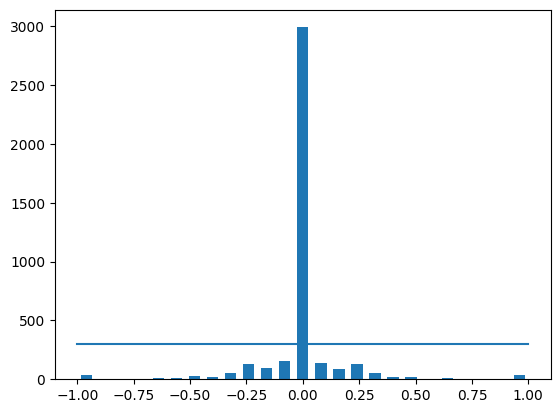

In [7]:
num_bins = 25
samples_per_bin = 300 # steering값이 0에 치중되어 있으므로(bias가 생기므로) threshold설정
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin)) # threshold를 histogram에 그린다

total data 4053
removed: 2690
remaining: 1363


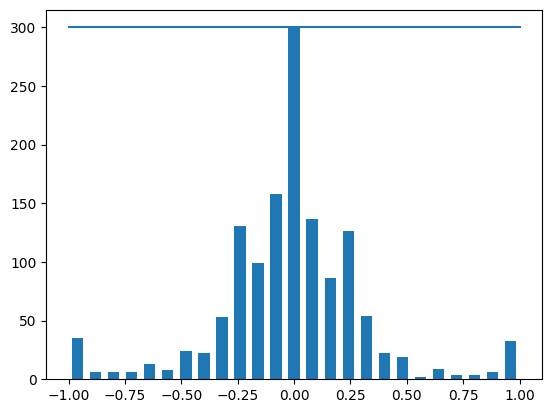

In [8]:
print('total data', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i) # 특정 steering bin에 속하는 row의 인덱스를 모두 추가
  list_ = shuffle(list_) # threshold를 넘으면 truncate실행. 그냥 truncate해버리면 드라이브의 특정 구간의 정보가 날아가므로 uniform하게 truncate하기 위해 shuffle을 사용.
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_) # remove list에 없앨 모든 리스트를 추가

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True) # remove list 에 나열된 index들을 data에서 제거
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [9]:

def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i] # row iteration
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.rstrip())) # 디렉터리 경로 만들기
    steering.append(float(indexed_data[3])) # steering angle추가
  image_paths = np.asarray(image_path) # numpy array로 변환
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data) # image와 label을 반환

In [10]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6) # validation set은 20%로 설정. 랜덤 시드 고정
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 1090
Valid Samples: 273


Text(0.5, 1.0, 'Validation set')

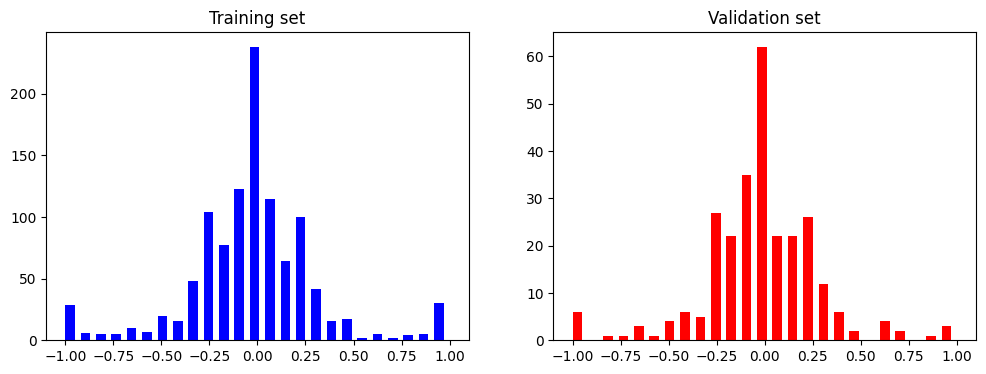

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4)) # array of axis objects
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue') # 첫번째(training) 히스토그램
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red') # 두번째(validation) 히스토그램
axes[1].set_title('Validation set')

In [12]:
# data augmentation : 데이터의 다양성을 위해 여러가지 변환을 가함.
# Zoom : Transformations that preserves lines and planes (e.g. Scaling, zooming)
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

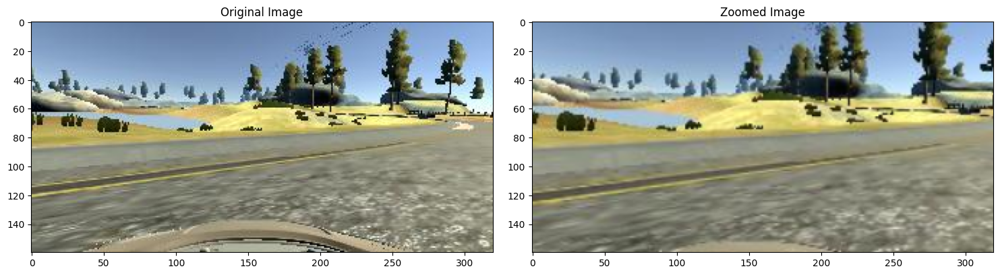

In [13]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [14]:
# pan : 최대 상하좌우 10% translation을 적용함.
def pan(image):
  pan = iaa.Affine(translate_percent={"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

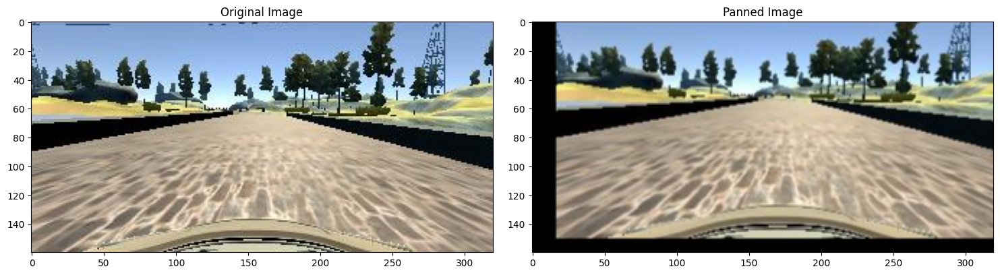

In [15]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [16]:
# random brightness : change the pixel intensity by multiplying certain value.
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

Text(0.5, 1.0, 'Brightness Altered Image')

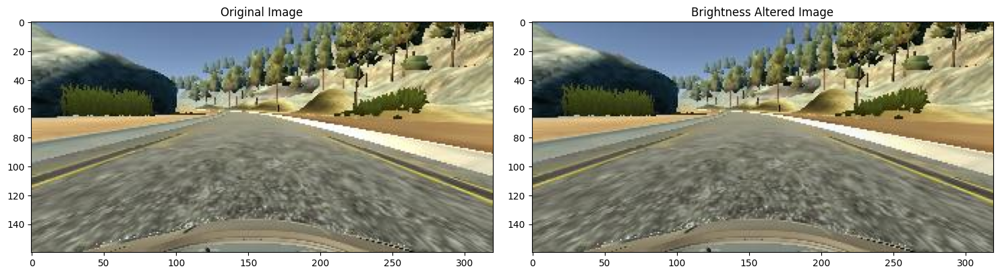

In [17]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

In [18]:
# flip : flips the image horizontaly, so we can get balanced distribution of steering angles.
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1) # 1 은 horizontal flip을 뜻함.
  steering_angle = -steering_angle # 좌우반전이 되었으므로 방향도 반대로 바꿔줌.
  return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle: -0.05')

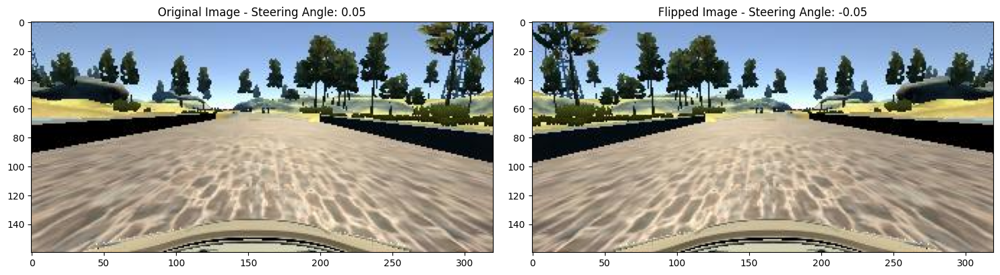

In [19]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle: ' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle: ' + str(flipped_steering_angle))

In [20]:
def random_augment(image, steering_angle): # 4가지의 augmentation을 랜덤으로 적용
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)
  return image, steering_angle

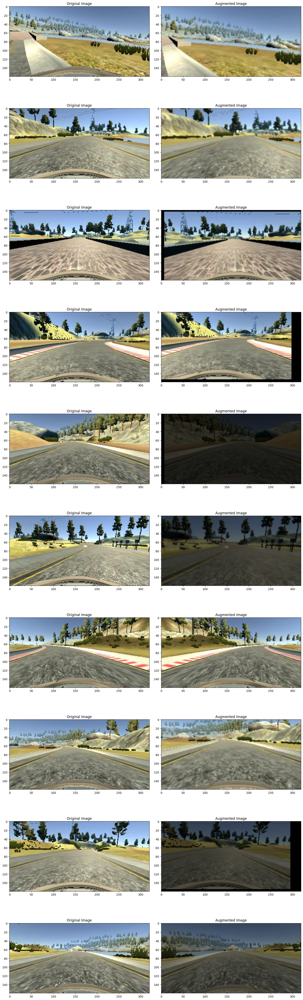

In [21]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('Augmented Image')

In [22]:
def img_preprocess(img): # img 경로로 실제 이미지 객체를 저장하는 함수
  img = img[60:135, :, :] # cropping unecessary parts of the image. 위쪽 부분과 아랬쪽 부분을 자른다.
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV) # nvidia model에서 권장하는 y(brightness)uv(chromium) color space로 변환
  img = cv2.GaussianBlur(img, (3, 3), 0) # 가우시안 스무딩 적용. kernel size = 3 x 3, deviation = 0
  img = cv2.resize(img, (200, 66)) # 이미지 사이즈 줄이기
  img = img/255 # normalization process
  return img

Text(0.5, 1.0, 'Preprocessed Image')

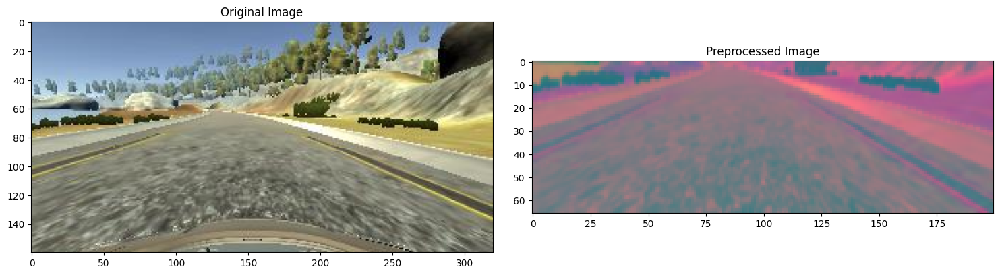

In [23]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [24]:
# 데이터가 많을때 모든 데이터를 한꺼번에 처리하기보다 작은 배치를 생성해서 처리함으로써 부하를 줄임.
def batch_generator(image_paths, steering_ang, batch_size, istraining): # istraining : boolean that specifies if the data is training set. False if it is validation set
  while True:
    batch_img = []
    batch_steering = []
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im) # 모든 데이터를 preprocess하기보다 batch데이터만 preprocess한다. Memory benefit.
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering)) # yield를 사용한 batch generator

Text(0.5, 1.0, 'Validation Image')

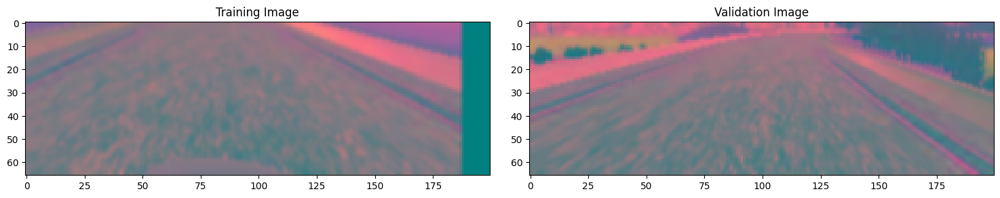

In [25]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1)) # next 는 다음 값을 generate함.
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [26]:
def nvidia_model():
  model = Sequential() # We omit normalization process here since we've already done it above.
  model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66, 200, 3), activation='elu')) # 5 x 5 kernel 24개. 이미지가 크므로 Vertical Stride와 Horizontal Stride 모두 2로 설정.
                                                                                                    # 가장자리의 픽셀은 큰 의미가 없으므로 padding설정 X.
  model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu')) # dying relu problem : relu 함수의 음수가 들어가면 0이 나옴. 즉 gradient가 0이 됨. Back propagation에서 weights가 update되지 않으므로
                                                                          # loss 값이 개선되지 않는 현상이 나타남. 따라서 0이 아닌 음수가 반환되는 elu activation function을 사용.
  model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu')) # 이미지가 충분히 작아졌으므로 stride 1로 설정.
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  # model.add(Dropout(0.5)) # data generator 을 추가해서 데이터의 다양성이 생겼으므로 Dropout레이어는 굳이 필요없게 됨.

  model.add(Flatten())
  model.add(Dense(100, activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(50, activation='elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(10, activation='elu'))
  # model.add(Dropout(0.5))
  model.add(Dense(1))

  optimizer = Adam(lr=1e-4)
  model.compile(loss='mse', optimizer=optimizer) # continuous한 data classifying(steering angle)을 하므로 loss function은 mean squared error.
  return model

In [27]:
model = nvidia_model()
print(model.summary)

<bound method Model.summary of <keras.engine.sequential.Sequential object at 0x7f44bac9be80>>


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [28]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300, # 100 * 300 = 30000 images per epoch
                              epochs=10,
                              validation_data = batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle=1) # 대용량 데이터를 다루므로 fit이 아닌 fit_gererator함수를 사용.

<ipython-input-28-60e5bb891965>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 122s 378ms/step - loss: 0.0884 - val_loss: 0.0531
Epoch 2/10
300/300 [==============================] - 112s 374ms/step - loss: 0.0691 - val_loss: 0.0539
Epoch 3/10
300/300 [==============================] - 111s 372ms/step - loss: 0.0629 - val_loss: 0.0559
Epoch 4/10
300/300 [==============================] - 128s 428ms/step - loss: 0.0583 - val_loss: 0.0417
Epoch 5/10
300/300 [==============================] - 128s 429ms/step - loss: 0.0557 - val_loss: 0.0380
Epoch 6/10
300/300 [==============================] - 112s 375ms/step - loss: 0.0490 - val_loss: 0.0388
Epoch 7/10
300/300 [==============================] - 110s 369ms/step - loss: 0.0456 - val_loss: 0.0345
Epoch 8/10
300/300 [==============================] - 126s 422ms/step - loss: 0.0441 - val_loss: 0.0330
Epoch 9/10
300/300 [==============================] - 112s 374ms/step - loss: 0.0412 - val_loss: 0.0317
Epoch 10/10
300/300 [==============================] - 127s 425m

Text(0.5, 0, 'Epoch')

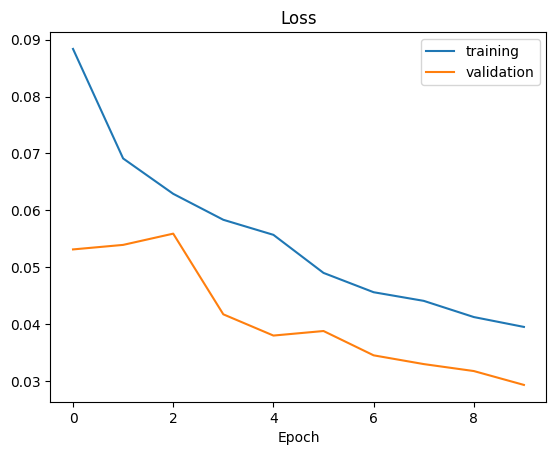

In [29]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [30]:
model.save('model.h5')

In [31]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>